In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import folium

import warnings
warnings.simplefilter('ignore')

/home/fairouz/.local/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
dvf_train = pd.read_csv("./dvf_train.csv")
dvf_test = pd.read_csv("./dvf_test.csv")

In [3]:
print(dvf_train.shape)
print(dvf_test.shape)

(18631, 49)
(1391, 48)


# Data preparation

In [4]:
dvf_train.head()

,index,Code service CH,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,...,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain,lon,lat,code_IRIS,code_district_admin,code_district_custom,Valeur fonciere
0,249338,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1256,...,3.0,NaN,NaN,NaN,2.253080,48.837201,751166131.0,61.0,Auteuil Sud,"650000,00"
1,249339,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1263,...,3.0,NaN,NaN,NaN,2.252551,48.837822,751166131.0,61.0,Auteuil Sud,"503029,00"
2,249340,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1263,...,4.0,NaN,NaN,NaN,2.251869,48.838918,751166131.0,61.0,Auteuil Sud,"791600,00"
3,249341,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1258,...,3.0,NaN,NaN,NaN,2.251527,48.843581,751166131.0,61.0,Auteuil Sud,"607600,00"
4,249342,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1306,...,3.0,NaN,NaN,NaN,2.251244,48.842975,751166131.0,61.0,Auteuil Sud,"860000,00"


In [5]:
dvf_train.duplicated().sum()

0

In [6]:
dvf_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18631 entries, 0 to 18630
Data columns (total 49 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   index                       18631 non-null  int64  
 1   Code service CH             0 non-null      float64
 2   Reference document          0 non-null      float64
 3   1 Articles CGI              0 non-null      float64
 4   2 Articles CGI              0 non-null      float64
 5   3 Articles CGI              0 non-null      float64
 6   4 Articles CGI              0 non-null      float64
 7   5 Articles CGI              0 non-null      float64
 8   No disposition              18631 non-null  int64  
 9   Date mutation               18631 non-null  int64  
 10  Nature mutation             18631 non-null  object 
 11  No voie                     18631 non-null  float64
 12  B/T/Q                       790 non-null    object 
 13  Type de voie                186

In [7]:
# Taux des données manquantes
dvf_train.isnull().sum()/len(dvf_train)*100

index                           0.000000
Code service CH               100.000000
Reference document            100.000000
1 Articles CGI                100.000000
2 Articles CGI                100.000000
3 Articles CGI                100.000000
4 Articles CGI                100.000000
5 Articles CGI                100.000000
No disposition                  0.000000
Date mutation                   0.000000
Nature mutation                 0.000000
No voie                         0.000000
B/T/Q                          95.759755
Type de voie                    0.059041
Code voie                       0.000000
Voie                            0.000000
Code postal                     0.000000
Commune                         0.000000
Code departement                0.000000
Code commune                    0.000000
Prefixe de section            100.000000
Section                         0.000000
No plan                         0.000000
No Volume                     100.000000
1er lot         

### Notre base de donnée contient des valeurs nulles et le type des variables n'est pas toujours approprié
### Dans une premiére partie du Data Cleaning, on va s'intéresser à éliminer les valeurs nulle

In [8]:
#Ici, nous constatons que la base de donnée contient beaucoup de variables qui ont un taux de plus de 79% des données manquantes.
#Nous allons exclure ces variables de notre jeu de données.

for col in dvf_train.columns:
    if dvf_train[col].isnull().sum()/len(dvf_train)*100 > 79:
        dvf_train.drop(columns = col, inplace = True)
        
dvf_train.shape

(18631, 28)

In [9]:
# Les variables qui nous restent:
dvf_train.columns

Index(['index', 'No disposition', 'Date mutation', 'Nature mutation',
       'No voie', 'Type de voie', 'Code voie', 'Voie', 'Code postal',
       'Commune', 'Code departement', 'Code commune', 'Section', 'No plan',
       '1er lot', 'Surface Carrez du 1er lot', '2eme lot', 'Nombre de lots',
       'Code type local', 'Type local', 'Surface reelle bati',
       'Nombre pieces principales', 'lon', 'lat', 'code_IRIS',
       'code_district_admin', 'code_district_custom', 'Valeur fonciere'],
      dtype='object')

In [10]:
index = ['index']
date = ['Date mutation']
data_quali = ['Nature mutation', 'Type de voie', 'Voie', 'Code postal', 'Commune', 'Code departement', 'Type local']
data_num = ['1er lot', 'Surface Carrez du 1er lot', 'Nombre de lots','Surface reelle bati','Nombre pieces principales', 'lon', 'lat', 'Valeur fonciere']

In [11]:
# En considérant ma compréhention du métier, j'ai fais toute seule quelques jugements qui peuvent étre corrigés avec l'aide d'un expert dans le domaine.
# J'ai choisie d'élimier quelques variables, en pensant que ces dérniéres n'affectent pas notre variable cible : Valeur fonciere.
# J'ai voulu garder la date car c'est intéressant de voir l'évolution des prix au cours du temps,
# mais malheuresement son formatage ne correspond pas à la description donnée et j'ai pas réussi à la formater correctement.

for col in dvf_train.columns:
    if col not in index + data_quali + data_num:
        dvf_train.drop(columns = col, inplace = True)
        
dvf_train.shape

(18631, 16)

In [12]:
dvf_train.head()

,index,Nature mutation,Type de voie,Voie,Code postal,Commune,Code departement,1er lot,Surface Carrez du 1er lot,Nombre de lots,Type local,Surface reelle bati,Nombre pieces principales,lon,lat,Valeur fonciere
0,249338,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,45.0,NaN,2,Appartement,89.0,3.0,2.253080,48.837201,"650000,00"
1,249339,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,37.0,"62,22",1,Appartement,55.0,3.0,2.252551,48.837822,"503029,00"
2,249340,Vente,RUE,DU CDT GUILBAUD A PARIS,75016,BOULOGNE-BILLANCOURT,92,32.0,NaN,2,Appartement,90.0,4.0,2.251869,48.838918,"791600,00"
3,249341,Vente,RUE,NUNGESSER ET COLI,75016,BOULOGNE-BILLANCOURT,92,3.0,"76,54",2,Appartement,66.0,3.0,2.251527,48.843581,"607600,00"
4,249342,Vente,RUE,NUNGESSER ET COLI,75016,BOULOGNE-BILLANCOURT,92,24.0,"108,08",2,Appartement,105.0,3.0,2.251244,48.842975,"860000,00"


In [13]:
dvf_train.isna().sum()

index                           0
Nature mutation                 0
Type de voie                   11
Voie                            0
Code postal                     0
Commune                         0
Code departement                0
1er lot                        55
Surface Carrez du 1er lot    6490
Nombre de lots                  0
Type local                      0
Surface reelle bati             0
Nombre pieces principales       0
lon                             7
lat                             7
Valeur fonciere                 0
dtype: int64

In [14]:
# La variable Surface Carrez du 1er lot comporte encore plusieurs valeurs nulles.
# Pour remplir ces valeur,le mieux est d'utiliser les autres variables et faire une prédiction mais celà sort du cadre de ce test.
# J'ai tout simplement garder une DataFrame où il n'y a pas de valeurs nulle de la variable Surface Carrez du 1er.
# Ce qui rest NaN par rapport aux autres variables est à élimier vu que le nombre n'est pas énorme.

dvf_train = dvf_train[dvf_train["Surface Carrez du 1er lot"].notna()]
dvf_train.dropna(inplace = True)

In [15]:
# Cette manipulation est juste pour réinitialiser l'index de la DataFrame pour ne pas avoir de probléme d'indexation plutard.

dvf_train.to_csv("./data_clean.csv")
dvf_train = pd.read_csv("./data_clean.csv")
dvf_train.head()

,Unnamed: 0,index,Nature mutation,Type de voie,Voie,Code postal,Commune,Code departement,1er lot,Surface Carrez du 1er lot,Nombre de lots,Type local,Surface reelle bati,Nombre pieces principales,lon,lat,Valeur fonciere
0,1,249339,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,37.0,"62,22",1,Appartement,55.0,3.0,2.252551,48.837822,"503029,00"
1,3,249341,Vente,RUE,NUNGESSER ET COLI,75016,BOULOGNE-BILLANCOURT,92,3.0,"76,54",2,Appartement,66.0,3.0,2.251527,48.843581,"607600,00"
2,4,249342,Vente,RUE,NUNGESSER ET COLI,75016,BOULOGNE-BILLANCOURT,92,24.0,"108,08",2,Appartement,105.0,3.0,2.251244,48.842975,"860000,00"
3,7,249348,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,1.0,"84,36",1,Appartement,84.0,4.0,2.252551,48.837822,"610000,00"
4,8,249352,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,63.0,"59,82",2,Appartement,59.0,3.0,2.252037,48.838423,"520000,00"


In [16]:
# On supprime la colonne "Unnamed: 0" qui correspond à l'ancien index et on vérifie l'existance des valeurs nulles et la nouvelle taille de notre base de donnée.

dvf_train.drop(columns = "Unnamed: 0", inplace = True)
print(dvf_train.isna().sum())
print(dvf_train.shape)
dvf_train.head()

index                        0
Nature mutation              0
Type de voie                 0
Voie                         0
Code postal                  0
Commune                      0
Code departement             0
1er lot                      0
Surface Carrez du 1er lot    0
Nombre de lots               0
Type local                   0
Surface reelle bati          0
Nombre pieces principales    0
lon                          0
lat                          0
Valeur fonciere              0
dtype: int64
(12128, 16)


,index,Nature mutation,Type de voie,Voie,Code postal,Commune,Code departement,1er lot,Surface Carrez du 1er lot,Nombre de lots,Type local,Surface reelle bati,Nombre pieces principales,lon,lat,Valeur fonciere
0,249339,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,37.0,"62,22",1,Appartement,55.0,3.0,2.252551,48.837822,"503029,00"
1,249341,Vente,RUE,NUNGESSER ET COLI,75016,BOULOGNE-BILLANCOURT,92,3.0,"76,54",2,Appartement,66.0,3.0,2.251527,48.843581,"607600,00"
2,249342,Vente,RUE,NUNGESSER ET COLI,75016,BOULOGNE-BILLANCOURT,92,24.0,"108,08",2,Appartement,105.0,3.0,2.251244,48.842975,"860000,00"
3,249348,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,1.0,"84,36",1,Appartement,84.0,4.0,2.252551,48.837822,"610000,00"
4,249352,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,63.0,"59,82",2,Appartement,59.0,3.0,2.252037,48.838423,"520000,00"


## Maintenant on s'intéresse plutot aux Types des données

In [17]:
# Les deux variables: Valeur fonciere et Surface Carrez du 1er lot sont censées étre numériques mais elles sont de type Object.
# On ne peut pas les transformer directement en Float à cause de la présence du virgule au lieu du point.
# On fait alors la corretion nécessaire.

for i in range(len(dvf_train)):
    dvf_train["Valeur fonciere"][i] = float(dvf_train["Valeur fonciere"][i].replace(',', '.'))
    dvf_train["Surface Carrez du 1er lot"][i] = float(dvf_train["Surface Carrez du 1er lot"][i].replace(',', '.'))

In [18]:
# On corrige les types des autres variables de la DataFrame

for col in data_quali:
    dvf_train[col] = dvf_train[col].astype('object')
    
for col in data_num:
    #dvf_train[col] = dvf_train[col].astype('float')
    dvf_train[col] = pd.to_numeric(dvf_train[col], errors = 'coerce')
    
dvf_train.dropna(inplace = True)

## Et maintenant que notre base de donnée est bien propre, on passe au Data Understanding and Visualisation

# Data Understanding / Visualisation

In [19]:
dvf_train.head()

,index,Nature mutation,Type de voie,Voie,Code postal,Commune,Code departement,1er lot,Surface Carrez du 1er lot,Nombre de lots,Type local,Surface reelle bati,Nombre pieces principales,lon,lat,Valeur fonciere
0,249339,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,37.0,62.22,1,Appartement,55.0,3.0,2.252551,48.837822,503029.0
1,249341,Vente,RUE,NUNGESSER ET COLI,75016,BOULOGNE-BILLANCOURT,92,3.0,76.54,2,Appartement,66.0,3.0,2.251527,48.843581,607600.0
2,249342,Vente,RUE,NUNGESSER ET COLI,75016,BOULOGNE-BILLANCOURT,92,24.0,108.08,2,Appartement,105.0,3.0,2.251244,48.842975,860000.0
3,249348,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,1.0,84.36,1,Appartement,84.0,4.0,2.252551,48.837822,610000.0
4,249352,Vente,AV,FERDINAND BUISSON,75016,BOULOGNE-BILLANCOURT,92,63.0,59.82,2,Appartement,59.0,3.0,2.252037,48.838423,520000.0


### Distribution de quelques variables dans la base de données

In [20]:
dvf_train['Type local'].value_counts(normalize = True).head()

Appartement    0.999258
Maison         0.000742
Name: Type local, dtype: float64

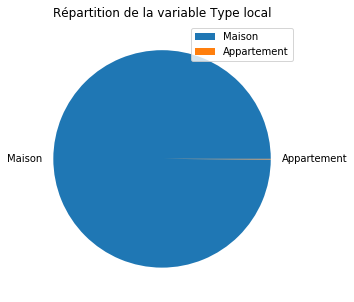

In [21]:
plt.figure(figsize=(5,5))
labels = ['Maison', 'Appartement']
colors = ['#ff9999','#66b3ff']
area = [dvf_train['Type local'].value_counts(normalize = True).head()][0]
plt.pie(area, labels=labels)
plt.title(label= 'Répartition de la variable Type local')
plt.legend()
plt.show()

In [22]:
dvf_train['Nature mutation'].value_counts(normalize = True).head()

Vente                                 0.998928
Adjudication                          0.000495
Vente en l'état futur d'achèvement    0.000330
Echange                               0.000247
Name: Nature mutation, dtype: float64

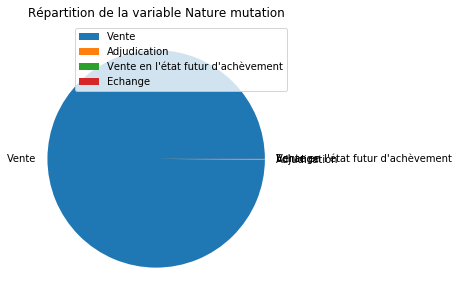

In [23]:
plt.figure(figsize=(5,5))
labels = ["Vente", "Adjudication", "Vente en l'état futur d'achèvement", "Echange" ]
colors = ['#ff9999','#66b3ff','#ffcc99','#fffc52']
area = [dvf_train['Nature mutation'].value_counts(normalize = True).head()][0]
plt.pie(area, labels=labels)
plt.title(label= 'Répartition de la variable Nature mutation')
plt.legend()
plt.show()

In [24]:
location=dvf_train.groupby(['lat','lon','Voie']).size().reset_index(name='count').sort_values(by='count',ascending=False)
location['color']=location['count'].apply(lambda count:"orange" if count>=400 else
                                         "brown" if count>=300 and count<400 else
                                         "yellow" if count>=200 and count<300 else
                                         "pink" if count>=150 and count<200 else
                                         "black" if count>=100 and count<150 else
                                         "blue" if count>=75 and count<100 else
                                         "green" if count>=50 and count<75 else
                                         "red")
location['size']=location['count'].apply(lambda count:35 if count>=400 else
                                         30 if count>=300 and count<400 else
                                         25 if count>=200 and count<300 else
                                         20 if count>=150 and count<200 else
                                         15 if count>=100 and count<150 else
                                         10 if count>=75 and count<100 else
                                         5 if count>=50 and count<75 else
                                         0.1)

m=folium.Map([46.2276,2.2137],zoom_start=5)

for lat,lon,area,color,count,size in zip(location['lat'],location['lon'],location['Voie'],location['color'],location['count'],location['size']):
     folium.CircleMarker([lat, lon],
                            popup=area,
                            radius=size,
                            color='r',
                            fill=True,
                            fill_opacity=0.6,
                            fill_color=color,
                           ).add_to(m)

In [25]:
m

### Corélation entre les variables

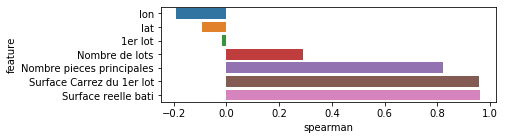

In [26]:
def spearman(frame, features):
    spr = pd.DataFrame()
    spr['feature'] = features
    spr['spearman'] = [frame[f].corr(frame['Valeur fonciere'], 'spearman') for f in features]
    spr = spr.sort_values('spearman')
    plt.figure(figsize=(6, 0.25*len(features)))
    sns.barplot(data=spr, y='feature', x='spearman', orient='h')
    
spearman(dvf_train, data_num[0:-1])

Pour analyser la corrélation entre les variables dans notre jeu de données, nous utlisons le test de Spearman pour savoir la relation entre les variables quantitatives.
On remarque que notre variable cible qui est Valeur fonciere est corrélé possitivement avec Surface reelle bati, Surface Carrez du 1er lot et Nombre pieces principales. 

Ce qui est vrai logiquement.

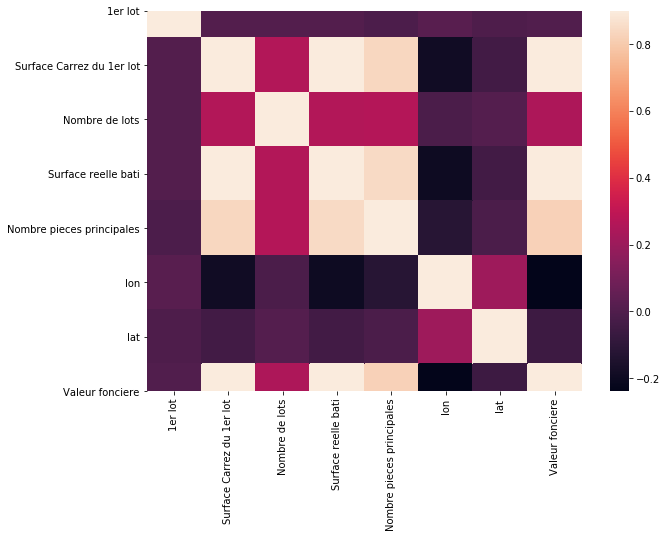

In [27]:
# Une autre maniére de voir la corélation entre les variable est la Matrice de corrélation, qui confirme bien le test de Spearman.

#Matrice de corrélation entre les variables (heatmap)
dvf_train_without_index = dvf_train.drop(columns = "index")
corrmat = dvf_train_without_index.corr()
plt.subplots(figsize=(10,7))
sns.heatmap(corrmat, vmax=0.9, square=True)

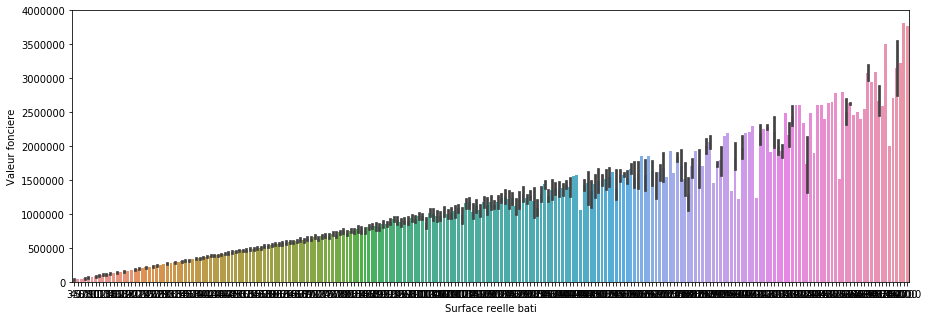

In [28]:
plt.figure(figsize = (15, 5))
sns.barplot(x = dvf_train["Surface reelle bati"], y = dvf_train["Valeur fonciere"],data=dvf_train );

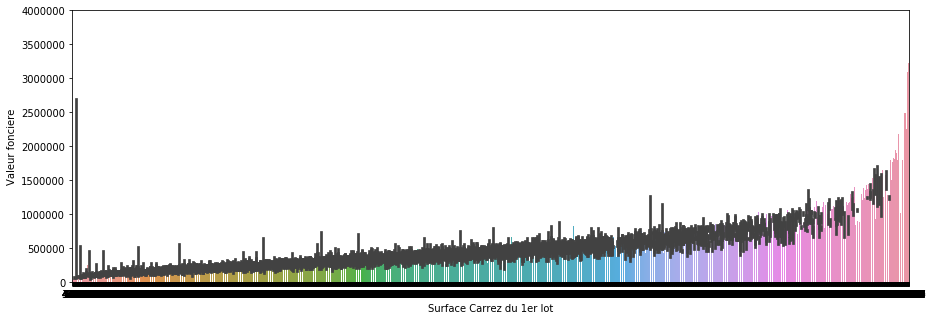

In [29]:
plt.figure(figsize = (15, 5))
sns.barplot(x = dvf_train["Surface Carrez du 1er lot"], y = dvf_train["Valeur fonciere"],data=dvf_train );

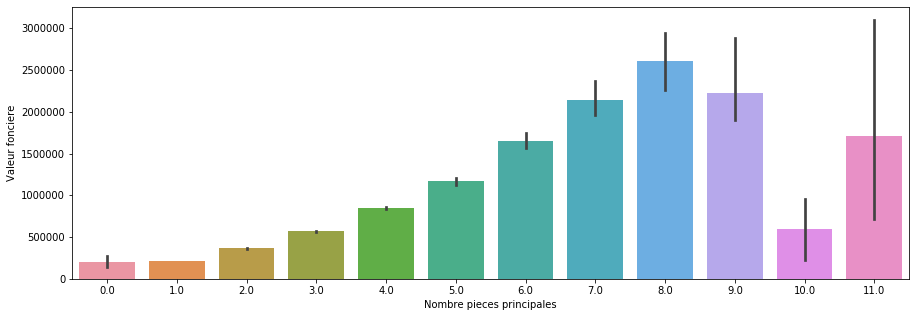

In [30]:
plt.figure(figsize = (15, 5))
sns.barplot(x = dvf_train["Nombre pieces principales"], y = dvf_train["Valeur fonciere"],data=dvf_train );

# Feature Selection

Pour la selection des variable, j'ai utilisé deux méthodes: f_regression et mutual_info_regression appliqué à un modéle de regression linéaire.

Pour cela, il faut coder nos variables qualitatives.

J'ai divisé la base de donnée sur 2: variables numériques et variables qualitatives.

In [31]:
df_num = []
df_num = pd.DataFrame(df_num)
for i in data_num:
    df_num[i] = dvf_train[i]

In [32]:
# On code les variables qualitatives pour pouvoir les utiliser
from sklearn.preprocessing import LabelEncoder
df_quali = []
df_quali = pd.DataFrame(df_quali)
for i in data_quali:
    df_quali[i] = LabelEncoder().fit_transform(dvf_train[i].values)

In [33]:
# On affiche les modifications effetués par le LabelEncoder
for i in data_quali:
    print(i,":\n", dvf_train[i].unique(), "\n")
    print("=========>", df_quali[i].unique(), "\n")
    print("-------------------------------------------------")

Nature mutation :
 ['Vente' 'Adjudication' 'Echange' "Vente en l'état futur d'achèvement"] 

=========> [2 0 1 3] 

-------------------------------------------------
Type de voie :
 ['AV' 'RUE' 'CITE' 'BD' 'QUAI' 'PL' 'PAS' 'CRS' 'SQ' 'IMP' 'VLA' 'VC'
 'ALL' 'CHE' 'SEN' 'COUR'] 

=========> [ 1 11  4  2 10  9  8  6 13  7 15 14  0  3 12  5] 

-------------------------------------------------
Voie :
 ['FERDINAND BUISSON' 'NUNGESSER ET COLI' 'D ORADOUR SUR GLANE' ...
 'SAINT SPIRE' 'DE LA LUNE' 'CASTEX'] 

=========> [1265 1766  380 ... 1980  603  232] 

-------------------------------------------------
Code postal :
 [75016 75015 75001 75003 75008 75007 75005 75006 75010 75009 75011 75012
 75013 75014 75017 75018 75020 75019 75004 75002] 

=========> [15 14  0  2  7  6  4  5  9  8 10 11 12 13 16 17 19 18  3  1] 

-------------------------------------------------
Commune :
 ['BOULOGNE-BILLANCOURT' 'ISSY-LES-MOULINEAUX' 'PARIS 01' 'PARIS 03'
 'PARIS 08' 'PARIS 07' 'PARIS 05' 'PARIS 06' 'PA

In [34]:
# Union de toutes les variables
data_train = pd.concat([df_quali, df_num], axis = 1)
data_train.dropna(inplace = True)
print(data_train.shape)
data_train.head()

(12122, 15)


,Nature mutation,Type de voie,Voie,Code postal,Commune,Code departement,Type local,1er lot,Surface Carrez du 1er lot,Nombre de lots,Surface reelle bati,Nombre pieces principales,lon,lat,Valeur fonciere
0,2.0,1.0,1265.0,15.0,0.0,1.0,0.0,37.0,62.22,1.0,55.0,3.0,2.252551,48.837822,503029.0
1,2.0,11.0,1766.0,15.0,0.0,1.0,0.0,3.0,76.54,2.0,66.0,3.0,2.251527,48.843581,607600.0
2,2.0,11.0,1766.0,15.0,0.0,1.0,0.0,24.0,108.08,2.0,105.0,3.0,2.251244,48.842975,860000.0
3,2.0,1.0,1265.0,15.0,0.0,1.0,0.0,1.0,84.36,1.0,84.0,4.0,2.252551,48.837822,610000.0
4,2.0,1.0,1265.0,15.0,0.0,1.0,0.0,63.0,59.82,2.0,59.0,3.0,2.252037,48.838423,520000.0


In [35]:
# Mise à l'échelle des données
from sklearn.preprocessing import StandardScaler
data_scaled = StandardScaler().fit_transform(data_train.values)

X = data_scaled[:,1:14] #features
y = data_scaled[:,14] #target

# Division en ensemble de train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)

In [36]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import mutual_info_regression
 
# feature selection
def select_features(X_train, y_train, X_test, score_func, k):
    # configure to select a subset of features
    fs = SelectKBest(score_func=score_func, k=k)
    # learn relationship from training data
    fs.fit(X_train, y_train)
    # transform train input data
    X_train_fs = fs.transform(X_train)
    # transform test input data
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs

                      feature  f_regression_score  \
9              Nombre de lots       123047.679012   
7                     1er lot        89713.054558   
10        Surface reelle bati        16861.333908   
8   Surface Carrez du 1er lot          509.291488   
11  Nombre pieces principales          503.641458   

    mutual_info_regression_score  
9                       1.509586  
7                       1.358587  
10                      0.585317  
8                       0.055966  
11                      0.052974  


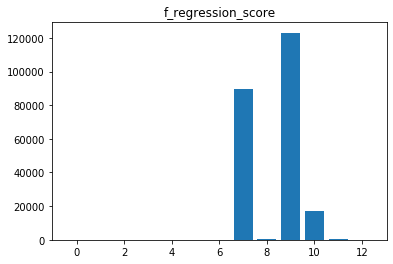

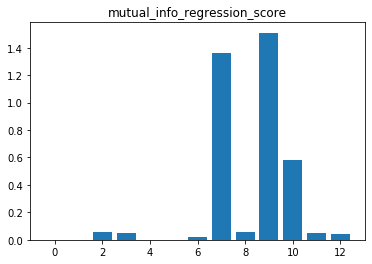

In [37]:
# Correlation Feature Selection
X_train_fr, X_test_fr, fr = select_features(X_train, y_train, X_test, f_regression, 'all')

# Mutual Information Feature Selection
X_train_mir, X_test_mir, mir = select_features(X_train, y_train, X_test, mutual_info_regression, 'all')

features = []
f_regression_score = []
mutual_info_regression_score = []
df_scores = pd.DataFrame()

# what are scores for the features
for i in range(len(fr.scores_)):
    features.append(data_train.columns[i])
    f_regression_score.append(fr.scores_[i])
    mutual_info_regression_score.append(mir.scores_[i])
    
df_scores["feature"] = features
df_scores["f_regression_score"] = f_regression_score
df_scores["mutual_info_regression_score"] = mutual_info_regression_score

print(df_scores.sort_values(by = ["f_regression_score", "mutual_info_regression_score"], ascending = False).head())

# plot the scores
plt.bar([i for i in range(len(fr.scores_))], fr.scores_)
plt.title("f_regression_score")
plt.show()
plt.bar([i for i in range(len(mir.scores_))], mir.scores_)
plt.title("mutual_info_regression_score")
plt.show()

In [38]:
# D'apres les deux méthodes, on voit trés bien que les variables: Nombre de lots, 1er lot et Surface reelle bati sont les plus pértinentes,
# avec des scores loins de celui des autres.

# Utiliser juste 3 variables dans un modéle n'est pas trés intéressant, alors j'ai choisi de garder toutes les variables
# (surtout que j'an ai supprimé déja pas mal dans la partie Data Cleaning)

# Data Modeling

In [39]:
data_train.head()

,Nature mutation,Type de voie,Voie,Code postal,Commune,Code departement,Type local,1er lot,Surface Carrez du 1er lot,Nombre de lots,Surface reelle bati,Nombre pieces principales,lon,lat,Valeur fonciere
0,2.0,1.0,1265.0,15.0,0.0,1.0,0.0,37.0,62.22,1.0,55.0,3.0,2.252551,48.837822,503029.0
1,2.0,11.0,1766.0,15.0,0.0,1.0,0.0,3.0,76.54,2.0,66.0,3.0,2.251527,48.843581,607600.0
2,2.0,11.0,1766.0,15.0,0.0,1.0,0.0,24.0,108.08,2.0,105.0,3.0,2.251244,48.842975,860000.0
3,2.0,1.0,1265.0,15.0,0.0,1.0,0.0,1.0,84.36,1.0,84.0,4.0,2.252551,48.837822,610000.0
4,2.0,1.0,1265.0,15.0,0.0,1.0,0.0,63.0,59.82,2.0,59.0,3.0,2.252037,48.838423,520000.0


In [40]:
X = data_train.drop("Valeur fonciere", 1).values #variables sans cilbe
y = data_train["Valeur fonciere"].values #variable cible

In [41]:
# Division en ensemble de train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

In [42]:
from sklearn.metrics import mean_absolute_percentage_error
#def mean_absolute_percentage_error(y_true, y_pred): 
    #y_true, y_pred = np.array(y_true), np.array(y_pred)
    #return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# J'a utilisé 6 modeles, visualisé la performance de chacun et comparé les scores donnés par les MAPEs
models = ["KNN", "CART", "Random Forest", "SVM", "Ridge Regression", "Linear Regression"]
MAPE = []

# KNN

Text(0, 0.5, 'Erreur')

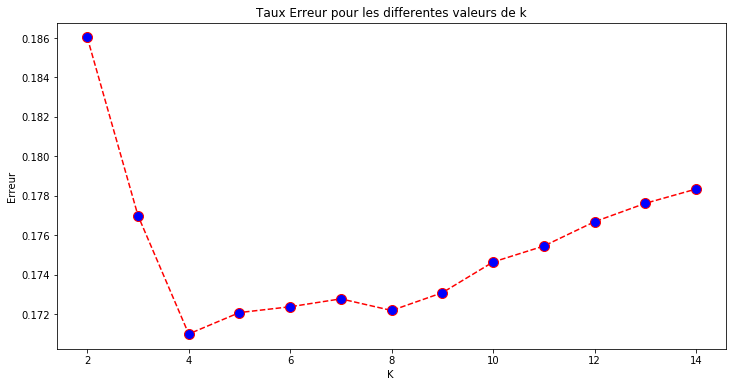

In [43]:
from sklearn.neighbors import KNeighborsRegressor

error = []
# J'ai changé à chaque fois l'intervalle des K de 2 jusqu'à 300.
# Mais pour garder un graph claire, je laisse un petit intervalle où il y a la meilleur valeur de k.
# J'ai calculé pour chaque itération, l'erreur pour les valeurs prédites de l'ensemble de test.

for i in range(2, 15):
    knn = KNeighborsRegressor(i)
    knn_model = knn.fit(X_train, y_train)
    pred_i = knn_model.predict(X_test)
    error.append(mean_absolute_percentage_error(pred_i, y_test))
    
plt.figure(figsize=(12, 6))
plt.plot(range(2, 15), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Taux Erreur pour les differentes valeurs de k')
plt.xlabel('K ')
plt.ylabel('Erreur')

In [44]:
# le meilleur k = 4 (là ou l'erreur est minimale)

In [45]:
# On applique maintenent le kNN pour le meilleur k
knn = KNeighborsRegressor(4)
knn_model = knn.fit(X_train, y_train)
y_pred_knn =knn_model.predict(X_test)

print('Accuracy of K-NN Classifier on training set: {:.2f}'
     .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN Classifier on test set: {:.2f}'
     .format(knn.score(X_test, y_test)))

print('Mean Absolute Percentage Error: {:.7f}'
     .format(mean_absolute_percentage_error(y_test, y_pred_knn)))

MAPE.append(mean_absolute_percentage_error(y_test, y_pred_knn))

Accuracy of K-NN Classifier on training set: 0.93
Accuracy of K-NN Classifier on test set: 0.88
Mean Absolute Percentage Error: 0.1879983


# CART

In [46]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()
dtr_model = dtr.fit(X_train, y_train)
y_pred_dtr = dtr_model.predict(X_test)

print('Accuracy of CART Regressor on training set: {:.2f}'
     .format(dtr.score(X_train, y_train)))
print('Accuracy of CART Regressor on test set: {:.2f}'
     .format(dtr.score(X_test, y_test)))

print('Mean Absolute Percentage Error: {:.7f}'
     .format(mean_absolute_percentage_error(y_test, y_pred_dtr)))

MAPE.append(mean_absolute_percentage_error(y_test, y_pred_dtr))

Accuracy of CART Regressor on training set: 1.00
Accuracy of CART Regressor on test set: 0.91
Mean Absolute Percentage Error: 0.1501887


# Random Forest

In [47]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr_model = rfr.fit(X_train, y_train)
y_pred_rfr = rfr_model.predict(X_test)

print('Accuracy of Random Forest Regressor on training set: {:.2f}'
     .format(rfr.score(X_train, y_train)))
print('Accuracy of Random Forest Regressor on test set: {:.2f}'
     .format(rfr.score(X_test, y_test)))

print('Mean Absolute Percentage Error: {:.7f}'
     .format(mean_absolute_percentage_error(y_test, y_pred_rfr)))

MAPE.append(mean_absolute_percentage_error(y_test, y_pred_rfr))

Accuracy of Random Forest Regressor on training set: 0.99
Accuracy of Random Forest Regressor on test set: 0.96
Mean Absolute Percentage Error: 0.1091646


# SVM

In [48]:
from sklearn.svm import LinearSVR
svm = LinearSVR(random_state=0, tol=1e-5)
svm_model = svm.fit(X_train, y_train)
y_pred_svm = svm_model.predict(X_test)

print('Accuracy of SVM Regressor on training set: {:.2f}'
     .format(svm.score(X_train, y_train)))
print('Accuracy of SVM Regressor on test set: {:.2f}'
     .format(svm.score(X_test, y_test)))

print('Mean Absolute Percentage Error: {:.7f}'
     .format(mean_absolute_percentage_error(y_test, y_pred_svm)))

MAPE.append(mean_absolute_percentage_error(y_test, y_pred_svm))

Accuracy of SVM Regressor on training set: 0.94
Accuracy of SVM Regressor on test set: 0.94
Mean Absolute Percentage Error: 0.1243807


# Ridge Regression

In [49]:
from sklearn.linear_model import Ridge
r = Ridge()
r_model = r.fit(X_train, y_train)
y_pred_r = r_model.predict(X_test)

print('Accuracy of Ridge Regression Classifier on training set: {:.2f}'
     .format(r.score(X_train, y_train)))
print('Accuracy of Ridge Regression Classifier on test set: {:.2f}'
     .format(r.score(X_test, y_test)))

print('Mean Absolute Percentage Error: {:.7f}'
     .format(mean_absolute_percentage_error(y_test, y_pred_r)))

MAPE.append(mean_absolute_percentage_error(y_test, y_pred_r))

Accuracy of Ridge Regression Classifier on training set: 0.95
Accuracy of Ridge Regression Classifier on test set: 0.95
Mean Absolute Percentage Error: 0.1246607


# Linear Regression

In [50]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr_model = lr.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

print('Accuracy of Ridge Regression Classifier on training set: {:.2f}'
     .format(r.score(X_train, y_train)))
print('Accuracy of Ridge Regression Classifier on test set: {:.2f}'
     .format(r.score(X_test, y_test)))

print('Mean Absolute Percentage Error: {:.7f}'
     .format(mean_absolute_percentage_error(y_test, y_pred_lr)))

MAPE.append(mean_absolute_percentage_error(y_test, y_pred_lr))

Accuracy of Ridge Regression Classifier on training set: 0.95
Accuracy of Ridge Regression Classifier on test set: 0.95
Mean Absolute Percentage Error: 0.1251904


In [51]:
MAPE = pd.DataFrame(MAPE)
models = pd.DataFrame(models)
models_MAPE = pd.concat([models, MAPE], axis = 1)
models_MAPE.columns = ["Model", "MAPE"]

# Comparaison des modéles

In [52]:
models_MAPE.sort_values(by = "MAPE", ascending = True)

,Model,MAPE
2,Random Forest,0.109165
3,SVM,0.124381
4,Ridge Regression,0.124661
5,Linear Regression,0.125190
1,CART,0.150189
0,KNN,0.187998


Si on considére la la MAPE comme indicateur, on peut considérer que Random Forest notre meilleur modéle.

# Testing

In [53]:
# La base de donnée dvf_test a la meme structure que dvf_train.
# Son nettoyage est fait dans un autre Notebook exactement de la meme maniére que dvf_train

dvf_test = pd.read_csv("./data_test_clean.csv")
dvf_test.drop(columns = "Unnamed: 0", inplace = True)
dvf_test.shape

(907, 15)

In [54]:
df_test_num = []
df_test_num = pd.DataFrame(df_test_num)
for i in data_num[0:-1]:
    df_test_num[i] = dvf_test[i]

In [55]:
# On code les variables qualitatives pour pouvoir les utiliser
df_test_quali = []
df_test_quali = pd.DataFrame(df_test_quali)
for i in data_quali:
    df_test_quali[i] = LabelEncoder().fit_transform(dvf_test[i].values)

In [56]:
# On affiche les modifications effetuer par le LabelEncoder
for i in data_quali:
    print(i,":\n", dvf_test[i].unique(), "\n")
    print("=========>", df_test_quali[i].unique(), "\n")
    print("-------------------------------------------------")

Nature mutation :
 ['Vente'] 

=========> [0] 

-------------------------------------------------
Type de voie :
 ['AV' 'RUE' 'BD' 'CITE' 'IMP' 'PAS' 'PL' 'VLA' 'SQ' 'QUAI' 'CRS' 'ALL'] 

=========> [ 1  9  2  3  5  6  7 11 10  8  4  0] 

-------------------------------------------------
Voie :
 ['FERDINAND BUISSON' 'D ORADOUR SUR GLANE' 'CHATEAUBRIAND' 'DE TURENNE'
 'DU PONT AUX CHOUX' 'SAINT DENIS' 'MONTAIGNE' 'COQUILLIERE'
 'SAINT MARTIN' 'DES GRAVILLIERS' 'DES VERTUS' 'DE SEBASTOPOL' 'DE MOSCOU'
 'VOLTA' 'LA BOETIE' 'BERNOULLI' 'AU MAIRE' 'DE LA GRANDE TRUANDERIE'
 'MESLAY' 'DE L ISLY' 'DU PAS DE LA MULE' 'DE CONSTANTINOPLE'
 'JEAN JACQUES ROUSSEAU' 'COMMINES' 'DU TEMPLE' 'DES PYRAMIDES'
 'DE POITOU' 'DU VERTBOIS' 'DE LA PEPINIERE' 'BALZAC' 'DE PONTHIEU'
 'DE MIROMESNIL' 'DES TOURNELLES' 'DU DRAGON' 'CLER' 'LACEPEDE' 'POLIVEAU'
 'ST DOMINIQUE' 'DE VERNEUIL' 'DES CISEAUX' 'CHRISTINE' 'LEON VAUDOYER'
 'DES BOULANGERS' 'RODIER' 'DE VINTIMILLE' 'ST DENIS' 'DU FBG SAINT DENIS'
 'DES REC

In [57]:
data_test = pd.concat([dvf_test["index"], df_test_quali, df_test_num], axis = 1)

In [58]:
# On réalise la prédiction avec notre meilleur modéle qui est Random Forest
predictions = rfr.predict(data_test.drop("index", 1))

In [59]:
solution = pd.DataFrame()
solution["index"] = data_test["index"]
solution["Valeur fonciere"] = predictions

In [60]:
solution.head()
print(solution.shape)

(907, 2)


In [61]:
solution.to_csv("./solutions.csv", index=False)